3. Support Vector Machines

- Primarily used for classification tasks, can also be used for for regression tasks (SVR) 
- SVM is a powerful classifier that finds the best possible boundary (hyperplane) that separates different classes

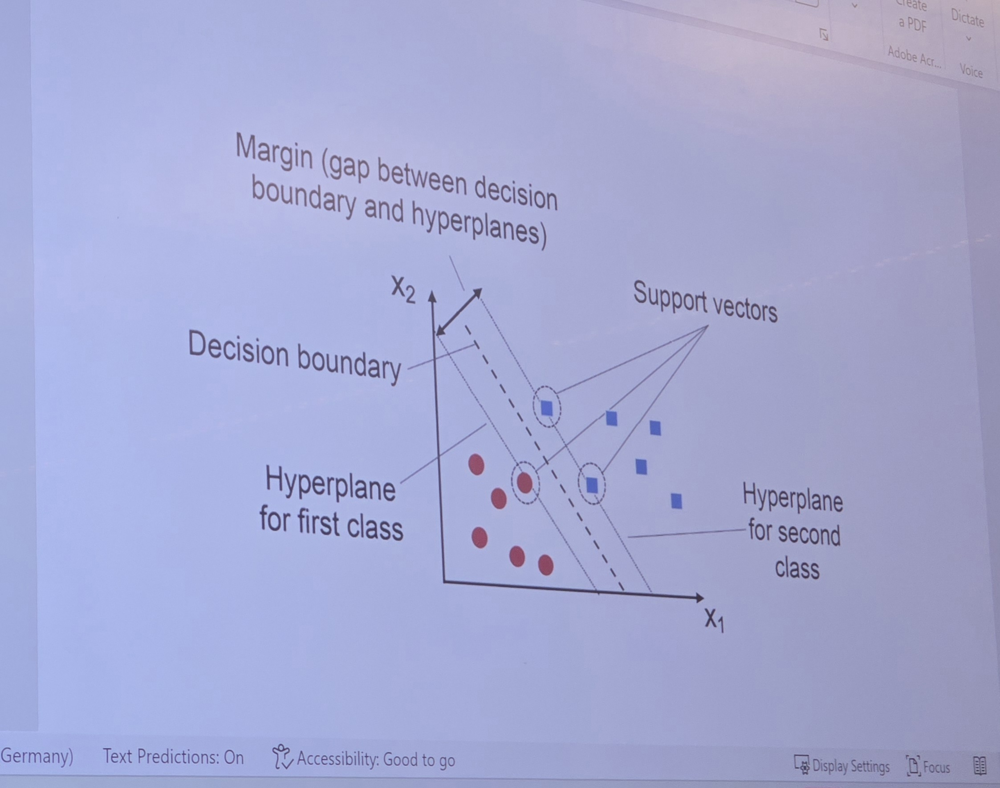

more the margin then the 2 classes will be easily seperatable   

- It works well for high-dimensional high-dimensional data (e.g., image classification ification, text classification).

- The key idea is maximizing the margin ber gin between two classes for better generalization. Can handle non-linearly separable data with kernel tricks

Example: Image classification of objects in pictures, Spam email detection, cancer classification (image and text classfication)

Kernels in SVM

Kernels in SVM

1. Linear kernel (kernel='linear') - Suitable for linearly separable data

2. Polynomial Kernel (kernel='poly') - Data with non-linear patterns

3. Radial Basis Function (RBF) Kernel (kernel='rbf') - Uses a Gaussian function to measure similarity between points, decision boundary is highly non-linear 

4. Sigmoid Kernel (kernel='sigmoid') - Similar to a neural network activation function (not commonly used as poly or rbf)

Feature scaling is mandatory for SVM (especially with RBF, Polynomial, and Sigmoid kernels) 


what is the correct approach 1st scale and split or split and scale
correct approach - Split the data and scaling is done   . there is a distance calculation so we have to do scaling SVM


we should scale after splitting to prevent data leakage, we dont need to see the test data . soooo we are not putting everything together and scaling , so we ensure realistic ds

good to go for standard scaling 




In [ ]:
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report
import pandas as pd

#load the data set
wine = datasets.load_wine()

#convert to df 

wine_df = pd.DataFrame(data=wine.data, columns=wine.feature_names)
wine_df['target'] = wine.target
wine_df.head() 


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [3]:
wine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
 13  targe

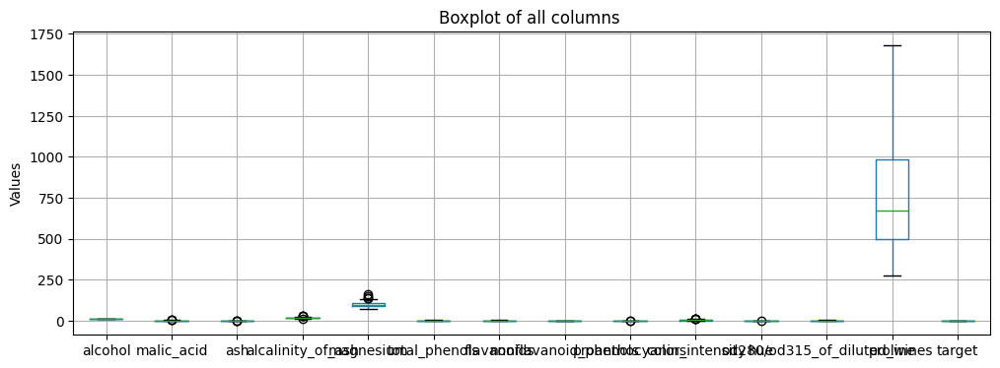

In [8]:
#checking for outliers
import matplotlib.pyplot as plt

wine_df.boxplot(figsize=(12,4))  # pandas method automatically creates boxplot for numerical columns
plt.title('Boxplot of all columns ')
plt.ylabel('Values')
plt.show()

In [9]:
# checking for null values
wine_df.isnull().sum()

alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
target                          0
dtype: int64

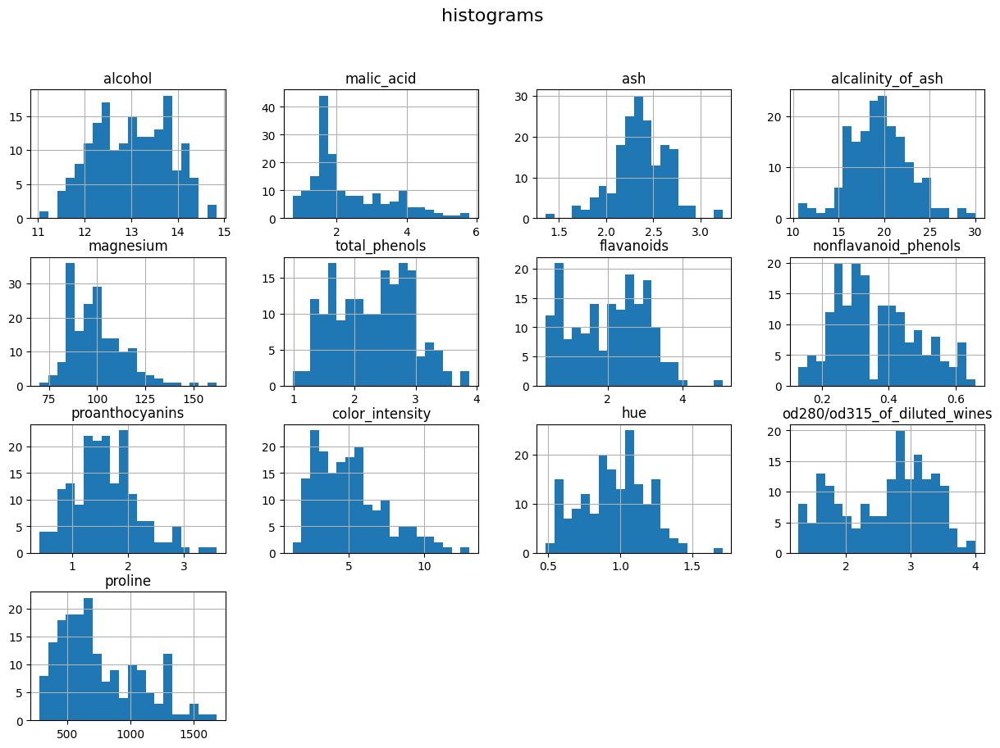

In [12]:
# plot histograms for all features - to understand their distributions
wine_df.drop('target', axis = 1).hist(bins = 20 , figsize = (15,10))
plt.suptitle('histograms',fontsize = 16 )
plt.show()

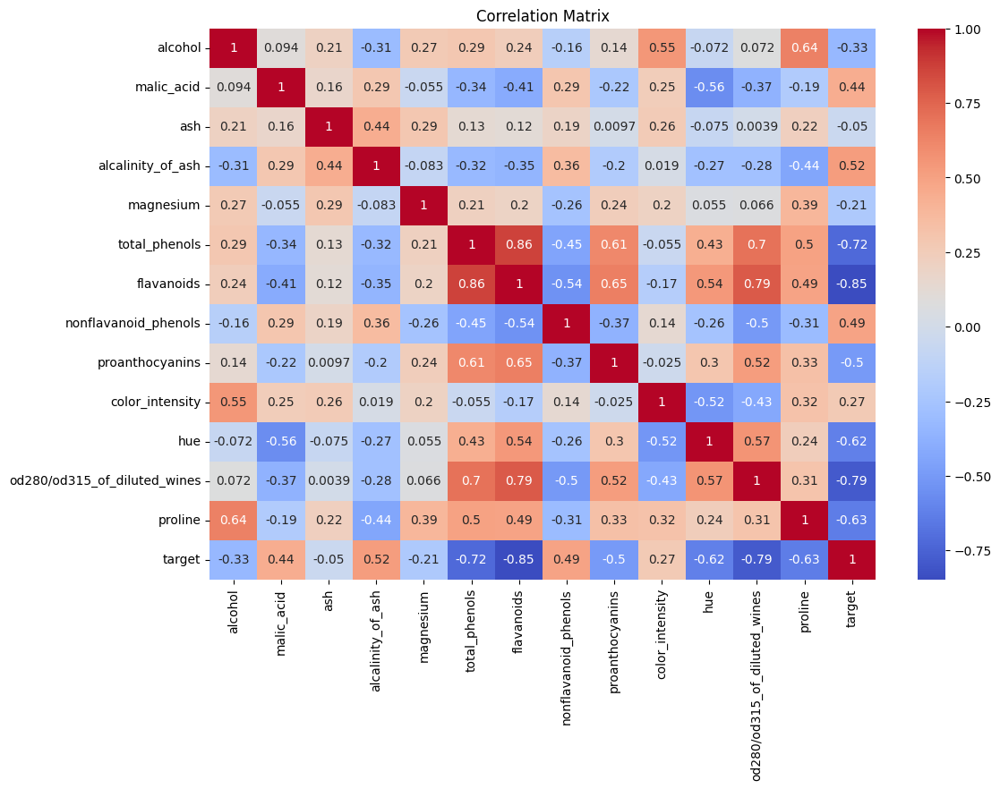

In [13]:
corr_martrix = wine_df.corr()

plt.figure(figsize=(12,8))
import seaborn as sns
sns.heatmap(corr_martrix, annot = True, cmap = 'coolwarm')
plt.title('Correlation Matrix') 
plt.show()

In [14]:


wine_df['target'].unique()

array([0, 1, 2])

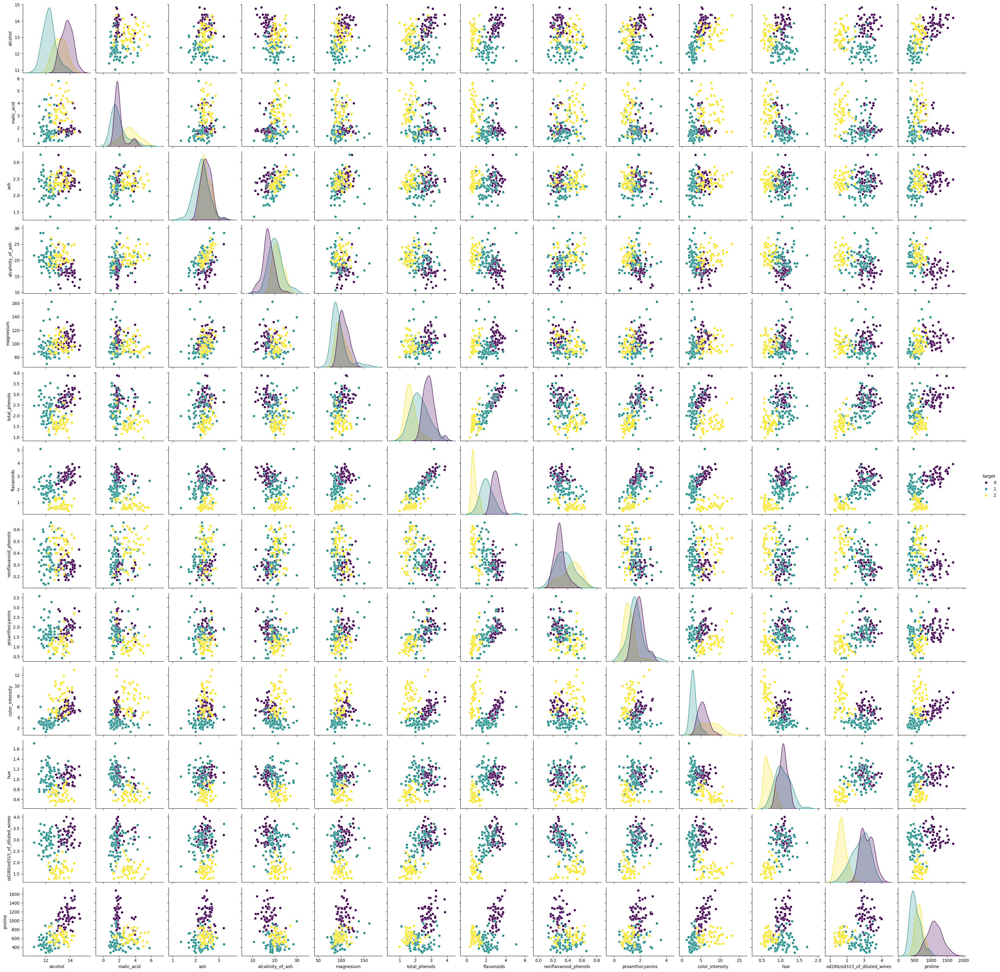

In [16]:
#pairplot - shows the relationships between all the paris of features

sns.pairplot(wine_df, hue = 'target', palette = 'viridis', height=2.5)
plt.show()

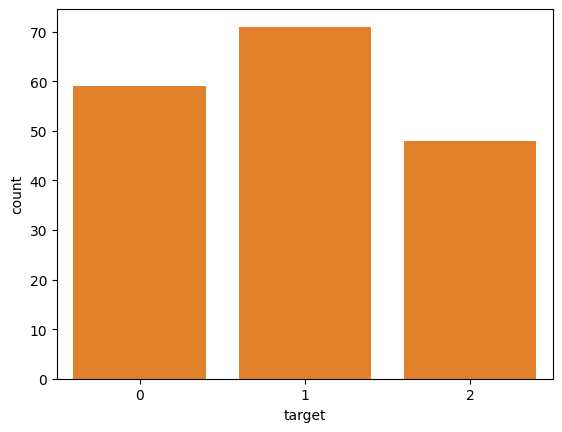

In [ ]:
#distribution of target classes (different types of wines) - classification taks

sns.countplot(x='target', data=wine_df)
plt.show()


# imbalance will not affect the classifier but it will affect the performance of the metrices like accuracy, precision, recall, f1-score etc.





In [34]:
#define the features and target

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split



X = wine_df.drop('target', axis=1)
y = wine_df['target']

#split the dataset
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)   

#feature scaling
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

#train the SVM model
svm_model = SVC(random_state=42)
svm_model.fit(x_train, y_train)

#make predictions
y_pred = svm_model.predict(x_test)


#evaluate the model

accuracy = accuracy_score(y_test, y_pred)
print(f'model accuracy: {accuracy:.4f}')
print("Classification Report:\n", classification_report(y_test, y_pred))


# fit -> it means we are acutally learning the parameters from the training data , mean we are finding the avg and sd of training data
# transform -> it means we are applying the learned parameters (avg and sd) to transform the data 
# we dont want to learn the test data parameters because it will lead to data leakage , we want to use the parameters learned from training data to transform the test data

# transforming is only for training  data, and fit and transform is for both

#confusion matrix
cm = confusion_matrix(y_test, y_pred)

model accuracy: 0.9722
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       0.93      1.00      0.97        14
           2       1.00      0.90      0.95        10

    accuracy                           0.97        36
   macro avg       0.98      0.97      0.97        36
weighted avg       0.97      0.97      0.97        36



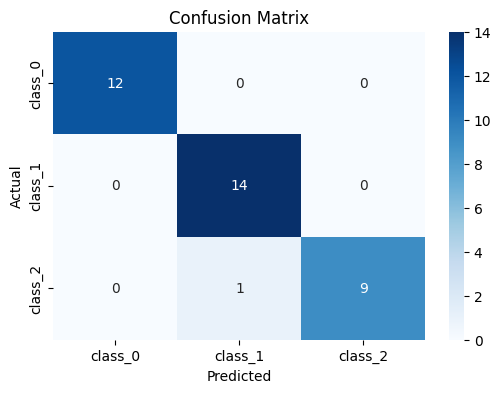

In [ ]:
#plot confusion matrix
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=wine.target_names, yticklabels=wine.target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


# diagonal elements represent correct predictions, while off-diagonal elements represent misclassifications.

In [37]:
# hyperparameter tuning 

from sklearn.model_selection import GridSearchCV, cross_val_score

#gamma is kernal coeffect it will decide how far the influence of a single training example reaches, with low values meaning 'far' and high values meaning 'close'.
# c is acutally regularization parameter it will decide how much we want to avoid misclassifying each training example. it controls the margin size and errors
# kernal - it is a function that transforms the data into higher dimensions so that we can find a hyperplane to separate the classes


param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale','auto'],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
   }

grid_search = GridSearchCV(SVC(), param_grid, cv=5,scoring = 'accuracy')
grid_search.fit(x_train, y_train)

# display the best parameters
print("Best Parameters:", grid_search.best_params_)

# train the ebst model
best_svm = grid_search.best_estimator_
y_pred_best = best_svm.predict(x_test)

#final accuracy
final_acc = accuracy_score(y_test, y_pred_best)
print(f'Final model accuracy after hyperparameter tuning: {final_acc:.4f}') 


Best Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Final model accuracy after hyperparameter tuning: 0.9722


In [38]:
# regularization is penalty for misclassification

In [39]:
from sklearn.model_selection import cross_val_score

#perform cross validation

cross_val_scores = cross_val_score(svm_model, X_train, y_train, cv=5, scoring='accuracy')

print(f'Cross validation scores: {cross_val_scores}') 
print(f'Mean Cross validation scores: {cross_val_scores.mean()}') 
print(f'std of cros validation acc: {np.std(cross_val_scores)}')

NameError: name 'X_train' is not defined

4. K-Nearest Neighbours (KNN)

- Used for both classification and regression tasks

- KNN is a simple, instance-based learning algorithm that classifies data points based on the

- majority class of their K nearest neighbors.

- KNN is non-parametric, meaning it does not make assumptions about the underlying data distribution.



which diff calc we will apply but by default we apply ecludians dist

scaling is needed becz its a distance based things.

we select classification - we vote for majorty


In [43]:
#import liraries
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report

In [45]:
#load breast cancer dataset
cancer = load_breast_cancer()

#convert to pandas df
cancer_df = pd.DataFrame(data=cancer.data, columns=cancer.feature_names)

#add target column
cancer_df['target'] = cancer.target
cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [46]:
#check for null values
cancer_df.isnull().sum()    

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
target                     0
dtype: int64

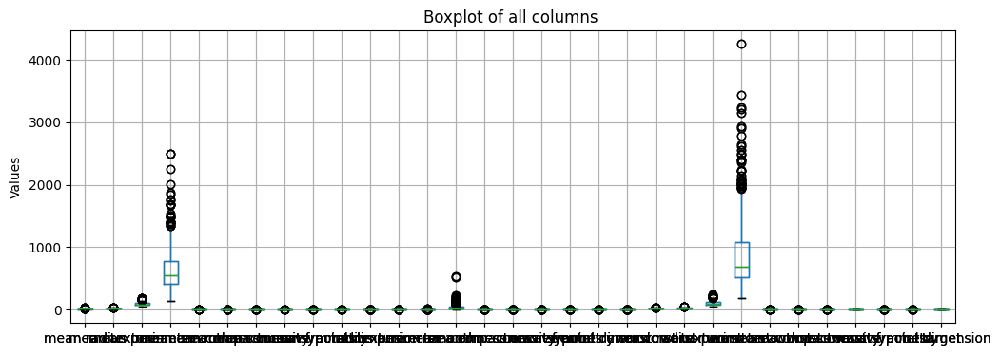

In [ ]:
#checking for outliers

cancer_df.boxplot(figsize=(12,4))
plt.title('Boxplot of all columns ')
plt.ylabel('Values')
plt.show()

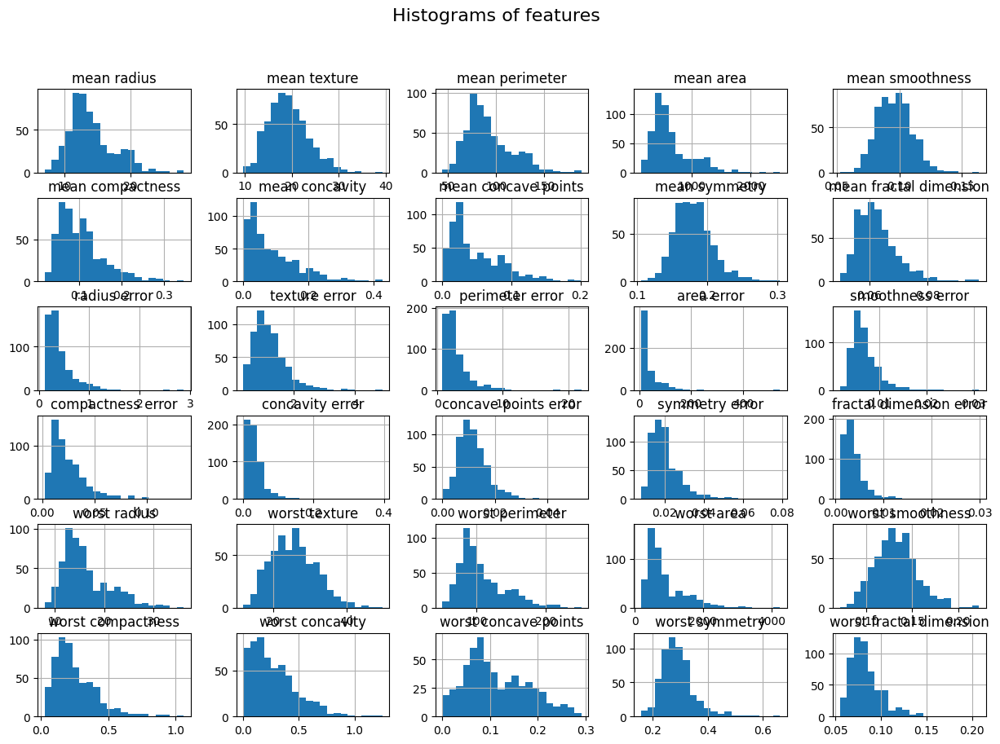

In [49]:
#checking data distribution
cancer_df.drop('target', axis=1).hist(bins=20, figsize=(15,10))
plt.suptitle('Histograms of features', fontsize=16)
plt.show()

In [51]:
#define the features and target
x = cancer_df.drop(columns='target')
y = cancer_df['target']

#split the dataset 
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

#featire scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

#predictions and evaluating the model
y_pred = knn.predict(X_test)

#checking training accuracy
accuracy = accuracy_score(y_test, y_pred)
training_acc = knn.score(X_train, y_train)  
print(f"Accuracy: {accuracy}")
print(f'model accuracy: {accuracy:.4f}')
print(f'training accuracy: {training_acc:.4f}')
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.956140350877193
model accuracy: 0.9561
training accuracy: 0.9736

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94        42
           1       0.96      0.97      0.97        72

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



In [52]:
# if training acc is much higher than vali acc -> overfitting (98% vs 70%)

Performance metrics

1.Accuracy: Measures the proportion of correct predictions among total predictions. 

2.Precision (Positive Predictive Value): Measures how many of the predicted positive cases are

actually positive.

3.Recall (Sensitivity, True Positive Rate): Measures how many actual positive cases were correctly

predicted.

5.ROC

4.F1-score: The harmonic mean of precision and recall, balancing both metrics. Curve (Receiver Operating Characteristic) & AUC (Area Under the Curve): The ROC curve plots the True Positive Rate (Recall) against the False Positive Rate. The AUC represents the overall ability of the model to distinguish between classes. A higher AUC (closer to 1) indicates better classification performance.

All these metrics used for classification problems

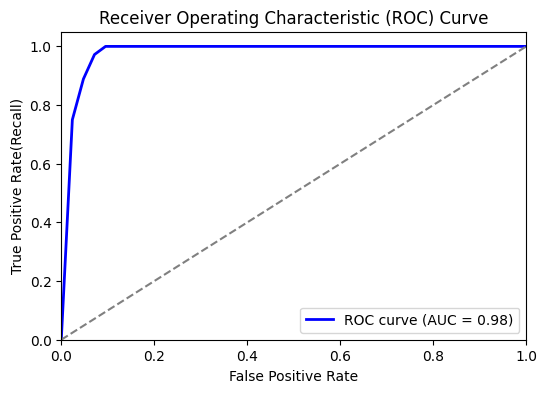

In [ ]:
from sklearn.metrics import roc_curve, auc

#predict probabilities (needed for ROC curve)
y_probs = knn.predict_proba(X_test)[:, 1]  # probabilities for the positive class

#compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

#plot ROC curve
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, color='blue', lw = 2 ,label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate(Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# curve should be as far as possible from diagonal line and AUC should be close to 1 , if this curver is close to diagonal line and AUC is close to 0.5 then model is not performing well and guessing somethings and poort in classification and the mdoel is able to diff the classes


# area under curve (AUC) - it is a single scalar value that summarizes the performance of the model across all classification thresholds. it ranges from 0 to 1 , with 1 indicating perfect classification and 0.5 indicating random guessing.

# consider all the performance matrices

For regression problems, we use different evaluation metrics: 
1. Mean Absolute Error (MAE) - Measures the average absolute difference between predictions and actual values.
2. Mean Squared Error (MSE) - Measures the average squared difference between predictions and actual values.
3. Root Mean Squared Error (RMSE) - Similar to MSE but in the same unit as the target variable. 
4. R2 Score (Coefficient of Determination) - Measures how well the model explains variance in the target variable.

IMPROVEMENTS

1. Reduce Dimensionality: Apply PCA or feature selection techniques to see if a lower k becomes optimal. 
2. Try Different Distance Metrics: Manħattan (L1) instead of Euclidean (L2) might work better in some cases.
3. Experiment with Weighted KNN: Instead of simple majority voting, weight neighbors based on distance 
4. Feature selection - Correlation Matrix, Feature Importance Using Mutual Information, Select K Best Features

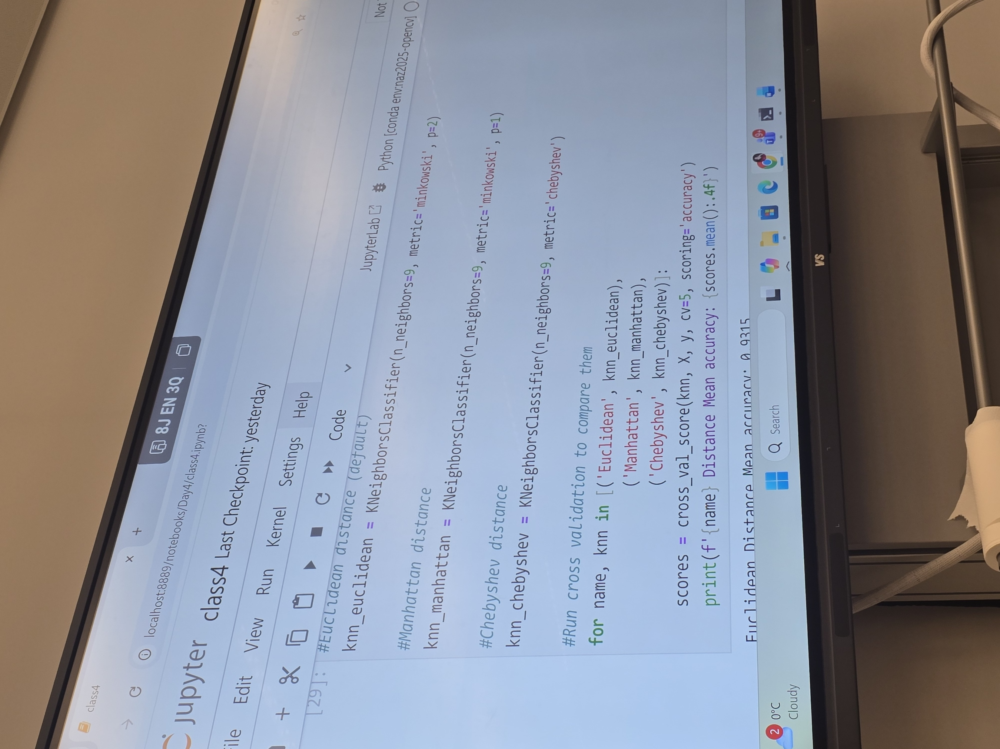

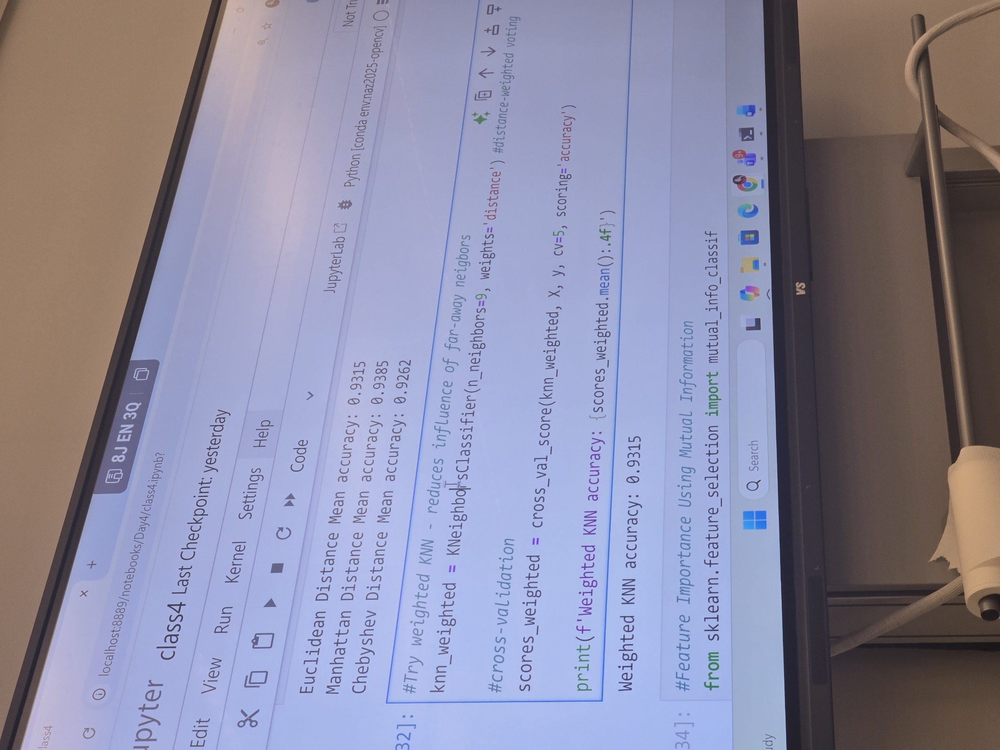

# techniques how to eliminate features

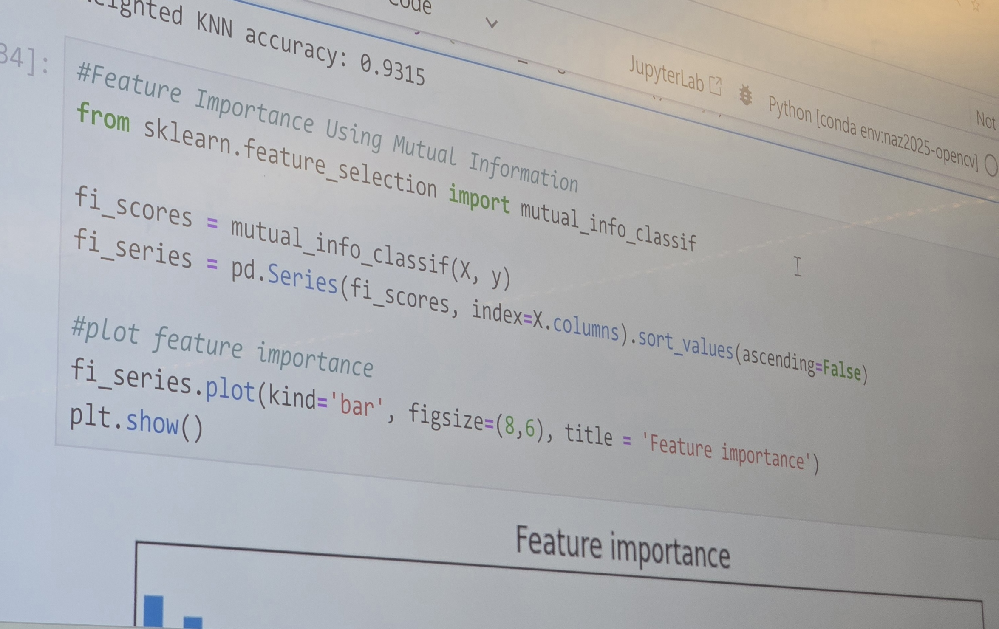

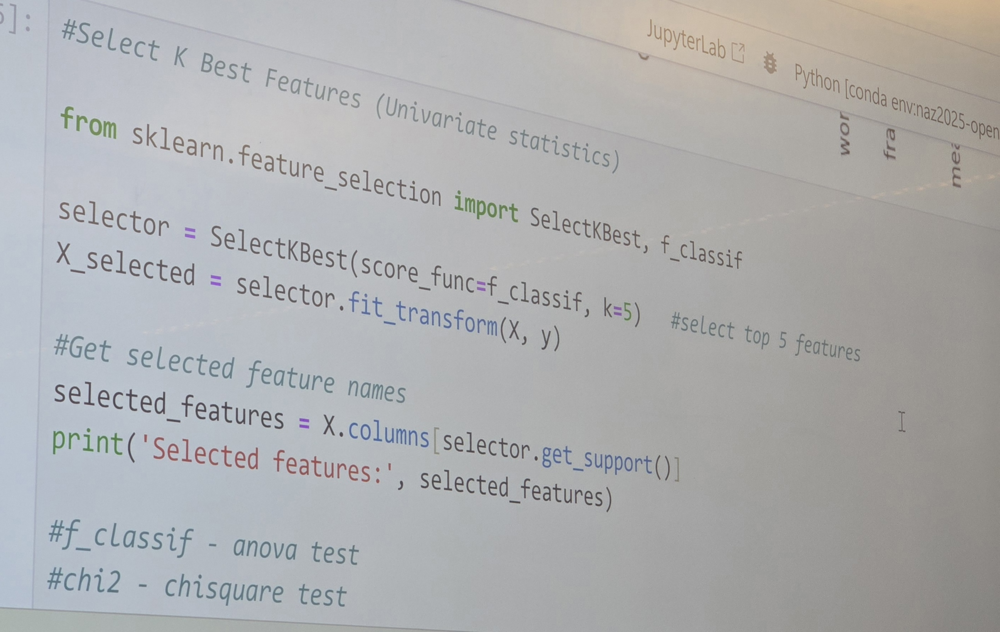

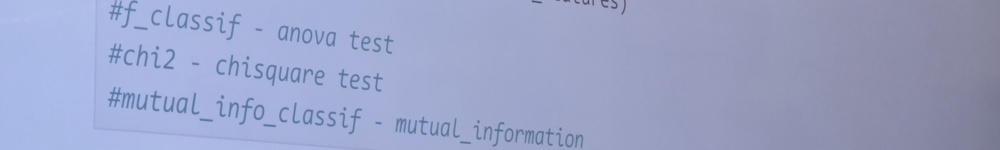

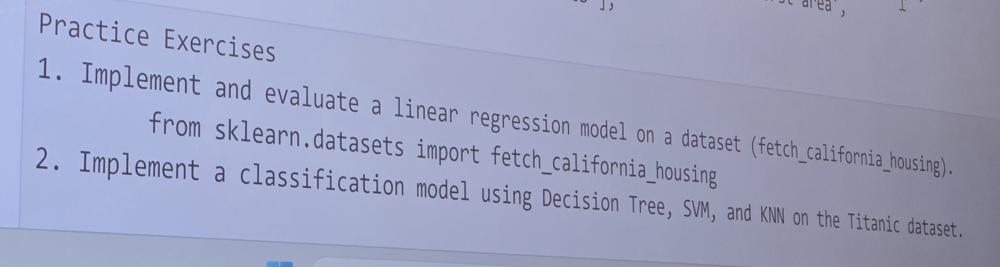

Advance Machine Learning techniques

Ensemble Methods in ML

- Ensemble learning is a technique in machine learning where multiple models (learners) are combined to obtain better predictive performance than could be achieved from any single model alone. 
- Ensemble methods work on the principle that different models may capture different patterns in the data, and their combined decision-making leads to a more robust and accurate prediction. 
- The key idea behind ensemble methods is that by aggregating multiple predictions, errors can be reduced, and generalization can be improved.




Types of Ensemble Methods

1.Bagging

2.Boosting

3.Stacking


#for regression task we decide by taking avg of predictions 
1.Bagging
Bagging reduces variance in machine learning models by training multiple models on different subsets of data (obtained using bootstrapping) and aggregating their predictions. It is especially useful for high-variance models like decision trees.

Steps: 
    Generate multiple bootstrap samples (randomly selected subsets with replacement) from the training data.
    Train a seperate model (usually of same type) on each bootstrap sample.
    Train a separate model (usually of the same type) on each bootstrap sample. Combine their predictions:

For classification: Use majority voting.

For regression: Use averaging.

Example: Random Forest


2.Boosting

Boosting focuses on reducing bias by training models sequentially, where each new model tries to correct the errors of the previous ones. It assigns higher weights to misclassified instances to focus on harder cases.

Steps:

Train a base model on the dataset.
Identify misclassified instances and assign them higher weights. 
Train a new model that focuses on these misclassified instances.
Repeat the process for several iterations.
Aggregate all models' predictions, typically using weighted voting or averaging.

Example: AdaBoost (Adaptive Boosting), Gradient Boosting Machines (GBM)


3.Stacking (Stacked Generalization)

Stacking combines predictions from multiple different types of models (heterogeneous models) using meta-model. Instead of simple voting or averaging, it learns how to best combine the predictions,

Steps:

- Train multiple diverse base models (e.g., Decision Tree, SVM, Neural Network) on the same dataset. 
- Collect predictions from all base models.
- Train a meta-model (often a linear regression or neural network) using these predictions as inputs.
- The meta-model learns how to optimally combine predictions from different base models. 

Example: Combining SVM, Decision Trees, Neural Networks

Ensemble methods significartly enhance predictive performance by leveraging multiple models. 
- Bagging is useful when reducing overfitting is a priority. 
- Boosting is ideal when improving weak learners through sequential training. 
- Stacking is beneficial when combining diverse models for optimal predictions,

By choosing the right ensemble method based on the problem, machine learning models can achieve higher accuracy , robustnesss and reliability in real world applications



1.Random Forest

Random Forest is an extension of bagging where multiple decision trees are trained on random subsets of the dataset. It introduces two levels of randomness:

- Bootstrap Sampling: Each tree is trained on a randomly selected subset of the training data (sampling with replacement).

all

Feature Randomness: Each split in a tree considers only a random subset of of features instead of features.

After training, the predictions from all trees are combined: For regression (continuous output): The average of all tree predictions is taken. For classification (categorical output): A majority vote is used

Example: Random Forest Regression Model using the California Housing dataset

In [61]:
# working on regression tasks

#import libraries

from  sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [62]:
#load california hosing dataset
california_housing = fetch_california_housing()

#convert to pandas df
cal_housing_df = pd.DataFrame(data=california_housing.data, columns=california_housing.feature_names)

#add target columns

cal_housing_df['target'] = california_housing.target
cal_housing_df.head()
cal_housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20640 non-null  float64
 1   HouseAge    20640 non-null  float64
 2   AveRooms    20640 non-null  float64
 3   AveBedrms   20640 non-null  float64
 4   Population  20640 non-null  float64
 5   AveOccup    20640 non-null  float64
 6   Latitude    20640 non-null  float64
 7   Longitude   20640 non-null  float64
 8   target      20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [63]:
cal_housing_df.isnull().sum()

MedInc        0
HouseAge      0
AveRooms      0
AveBedrms     0
Population    0
AveOccup      0
Latitude      0
Longitude     0
target        0
dtype: int64

In [64]:
# define the features and target
X = cal_housing_df.drop(columns='target')
y = cal_housing_df['target']

#split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:
#initilialize the model with 100 trees
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

#train the model
rf_model.fit(X_train, y_train)

#make predictions
y_pred = rf_model.predict(X_test)

#calculate mean squared error and r2 score
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse:.4f}')

r2 = r2_score(y_test, y_pred)
print(f'R^2 Score: {r2:.4f}')   

# MSE should be less then r2 score because MSE is in the unit of target variable and r2 score is unitless

Mean Squared Error: 0.2554
R^2 Score: 0.8051


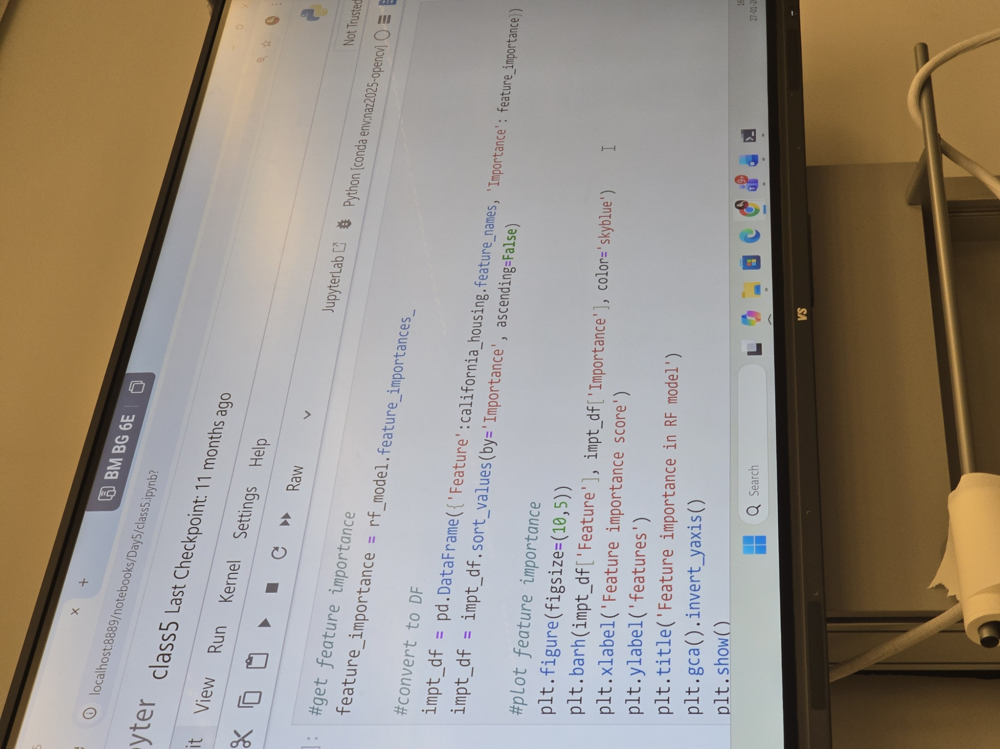

IMPROVEMENTS

1. Increase the number of trees (n_estimators) - n=300 or 500

2. Feature selection - remove less important features

3. Hyperparameter tuning with grid search

4. Try feature engineering

5. Use other advanced ensemble methods - boosting

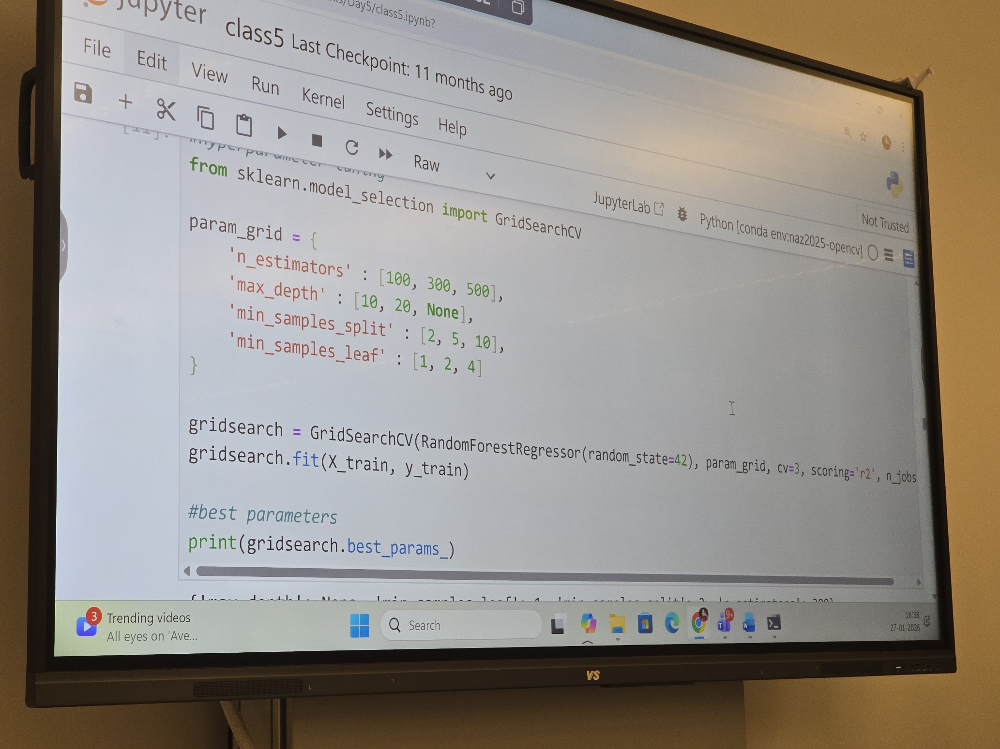